This is about a smoke detector based on ai sensor fusion to determine a fire alarm or not.

# EDA

In [2]:
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

In [3]:
data_org = pd.read_csv("smoke_detection_iot.csv")
data_org.head()

,Unnamed: 0,UTC,Temperature[C],Humidity[%],TVOC[ppb],eCO2[ppm],Raw H2,Raw Ethanol,Pressure[hPa],PM1.0,PM2.5,NC0.5,NC1.0,NC2.5,CNT,Fire Alarm
0,0,1654733331,20.000,57.36,0,400,12306,18520,939.735,0.0,0.0,0.0,0.0,0.0,0,0
1,1,1654733332,20.015,56.67,0,400,12345,18651,939.744,0.0,0.0,0.0,0.0,0.0,1,0
2,2,1654733333,20.029,55.96,0,400,12374,18764,939.738,0.0,0.0,0.0,0.0,0.0,2,0
3,3,1654733334,20.044,55.28,0,400,12390,18849,939.736,0.0,0.0,0.0,0.0,0.0,3,0
4,4,1654733335,20.059,54.69,0,400,12403,18921,939.744,0.0,0.0,0.0,0.0,0.0,4,0


In [4]:
duplicate_rows = data_org.duplicated()
num_duplicates = duplicate_rows.sum()
print("Number of duplicate rows:", num_duplicates)

Number of duplicate rows: 0


In [5]:
data_org.columns.tolist()

['Unnamed: 0',
 'UTC',
 'Temperature[C]',
 'Humidity[%]',
 'TVOC[ppb]',
 'eCO2[ppm]',
 'Raw H2',
 'Raw Ethanol',
 'Pressure[hPa]',
 'PM1.0',
 'PM2.5',
 'NC0.5',
 'NC1.0',
 'NC2.5',
 'CNT',
 'Fire Alarm']

In [6]:
# Drop index column
data_org.drop(['Unnamed: 0','UTC', 'CNT'], axis = 1, inplace = True)

In [7]:
data_org['Fire Alarm'] = data_org['Fire Alarm'].astype('category')

In [8]:
data_org.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62630 entries, 0 to 62629
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   Temperature[C]  62630 non-null  float64 
 1   Humidity[%]     62630 non-null  float64 
 2   TVOC[ppb]       62630 non-null  int64   
 3   eCO2[ppm]       62630 non-null  int64   
 4   Raw H2          62630 non-null  int64   
 5   Raw Ethanol     62630 non-null  int64   
 6   Pressure[hPa]   62630 non-null  float64 
 7   PM1.0           62630 non-null  float64 
 8   PM2.5           62630 non-null  float64 
 9   NC0.5           62630 non-null  float64 
 10  NC1.0           62630 non-null  float64 
 11  NC2.5           62630 non-null  float64 
 12  Fire Alarm      62630 non-null  category
dtypes: category(1), float64(8), int64(4)
memory usage: 5.8 MB


No null values

In [9]:
data_org.head()

,Temperature[C],Humidity[%],TVOC[ppb],eCO2[ppm],Raw H2,Raw Ethanol,Pressure[hPa],PM1.0,PM2.5,NC0.5,NC1.0,NC2.5,Fire Alarm
0,20.000,57.36,0,400,12306,18520,939.735,0.0,0.0,0.0,0.0,0.0,0
1,20.015,56.67,0,400,12345,18651,939.744,0.0,0.0,0.0,0.0,0.0,0
2,20.029,55.96,0,400,12374,18764,939.738,0.0,0.0,0.0,0.0,0.0,0
3,20.044,55.28,0,400,12390,18849,939.736,0.0,0.0,0.0,0.0,0.0,0
4,20.059,54.69,0,400,12403,18921,939.744,0.0,0.0,0.0,0.0,0.0,0


In [10]:
data_org.describe()

,Temperature[C],Humidity[%],TVOC[ppb],eCO2[ppm],Raw H2,Raw Ethanol,Pressure[hPa],PM1.0,PM2.5,NC0.5,NC1.0,NC2.5
count,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000
mean,15.970424,48.539499,1942.057528,670.021044,12942.453936,19754.257912,938.627649,100.594309,184.467770,491.463608,203.586487,80.049042
std,14.359576,8.865367,7811.589055,1905.885439,272.464305,609.513156,1.331344,922.524245,1976.305615,4265.661251,2214.738556,1083.383189
min,-22.010000,10.740000,0.000000,400.000000,10668.000000,15317.000000,930.852000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,10.994250,47.530000,130.000000,400.000000,12830.000000,19435.000000,938.700000,1.280000,1.340000,8.820000,1.384000,0.033000
50%,20.130000,50.150000,981.000000,400.000000,12924.000000,19501.000000,938.816000,1.810000,1.880000,12.450000,1.943000,0.044000
75%,25.409500,53.240000,1189.000000,438.000000,13109.000000,20078.000000,939.418000,2.090000,2.180000,14.420000,2.249000,0.051000
max,59.930000,75.200000,60000.000000,60000.000000,13803.000000,21410.000000,939.861000,14333.690000,45432.260000,61482.030000,51914.680000,30026.438000


## Test train split

In [11]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(data_org, test_size=0.2, random_state=42)

In [12]:
summary_stats = train.groupby('Fire Alarm').describe()
summary_stats

Temperature[C]                                              \
                    count       mean        std    min     25%    50%   
Fire Alarm                                                              
0                 14279.0  19.683362  14.948299 -22.01  13.563  20.51   
1                 35825.0  14.432118  13.840977 -22.01   5.009  20.01   

                           Humidity[%]             ...   NC1.0             \
                75%    max       count       mean  ...     75%        max   
Fire Alarm                                         ...                      
0           26.9065  59.93     14279.0  42.952966  ...  2.0795  47089.598   
1           24.7300  41.41     35825.0  50.796451  ...  2.3000  51914.680   

              NC2.5                                                       \
              count        mean          std    min    25%    50%    75%   
Fire Alarm                                                                 
0           14279.0  170.676916  1391.377574  0.000  0.019  0.039  0.048   
1           35825.0   41.719360   925.750931  0.004  0.038  0.045  0.052   

                       
                  max  
Fire Alarm             
0           26916.836  
1           30026.438  

[2 rows x 96 columns]

In [13]:
train['Fire Alarm'].value_counts()

1    35825
0    14279
Name: Fire Alarm, dtype: int64

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
import ptitprince as pt

plt.style.use('rose-pine-moon')

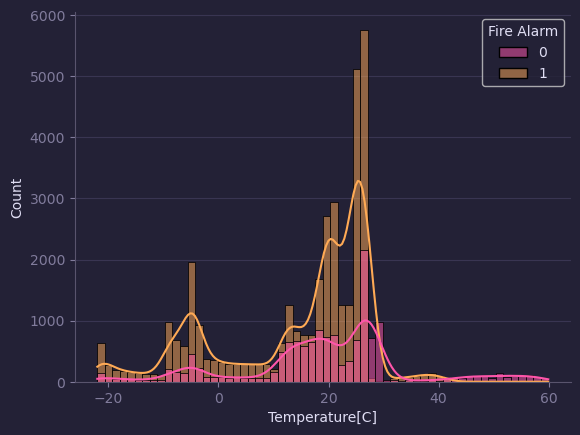

In [15]:
sns.histplot(data=train, x='Temperature[C]', hue='Fire Alarm', kde=True, bins=60, palette='spring')
plt.show()

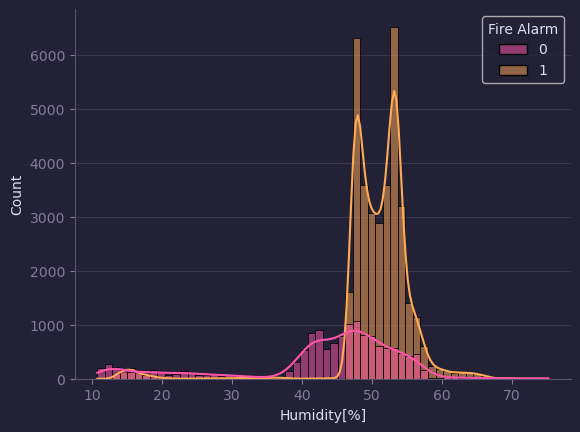

In [16]:
sns.histplot(data=train, x='Humidity[%]', hue='Fire Alarm', kde=True, bins=60, palette='spring')
plt.show()

If the fire is contained within a confined or enclosed space, the moisture released from the burning materials, along with limited ventilation, can contribute to higher humidity levels in that specific area. The confinement of the fire can prevent the dissipation of moisture, leading to localized high humidity. Also, traditional fire alarms can cause a false alarm in high humidity levels. But we could see that this device won't trigger an alarm just because the humidity is high because there are many cases when the humidity is high but the alarm is not triggered.  

Fires involve the rapid release of energy through the combustion of fuel. During combustion, gases are generated, including hot air and smoke, which can cause a temporary increase in air pressure in the immediate vicinity of the fire source.

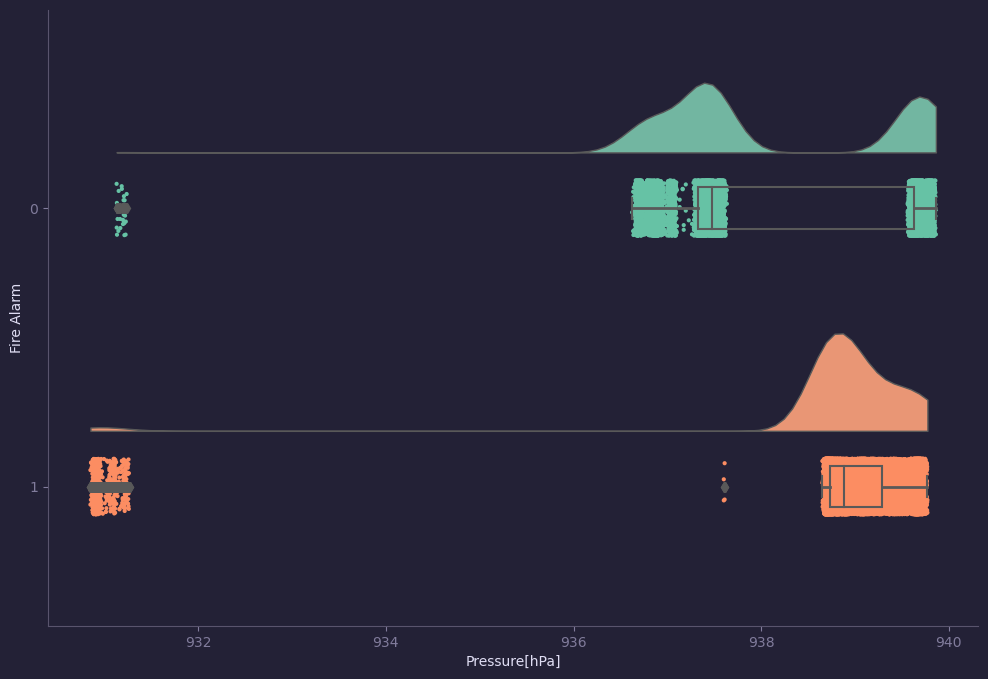

In [18]:
plt.figure(figsize = (12,8))
pt.RainCloud(data = train, x = 'Fire Alarm', y = 'Pressure[hPa]', orient='h')
plt.show()

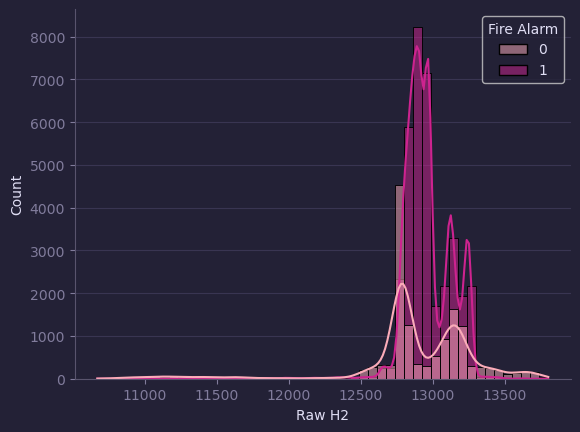

In [19]:
bin_size = 50
sns.histplot(data=train, x='Raw H2', hue='Fire Alarm', kde=True, bins=bin_size, palette='RdPu')
plt.show()

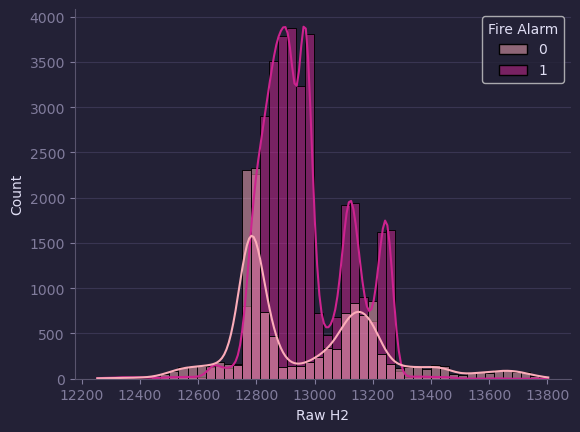

In [20]:
# Zoomed 
h2_high = train[train['Raw H2'] > 12250]
sns.histplot(data=h2_high, x='Raw H2', hue='Fire Alarm', kde=True, bins=50, palette='RdPu')
plt.show()

In certain types of fires, hydrogen gas can be produced as a byproduct of the chemical reactions taking place. For example, when organic materials like wood, paper, or plastics burn, they release various gases, including hydrogen gas.

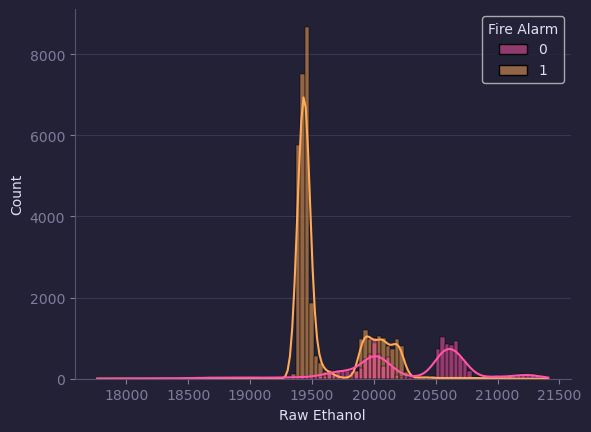

In [21]:
sns.histplot(data=h2_high, x='Raw Ethanol', hue='Fire Alarm', kde=True, bins=100, palette='spring')
plt.show()

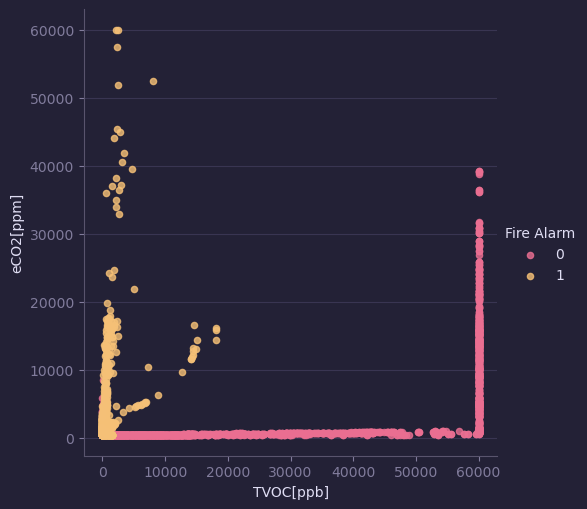

In [23]:
marker_size = 20
sns.lmplot('TVOC[ppb]', 'eCO2[ppm]', data= train,  hue='Fire Alarm', fit_reg=False, scatter_kws={'s': marker_size})
plt.show()

 Fires often produce smoke, which contains various combustion byproducts, including carbon dioxide. When a fire is present, the release of smoke particles and other pollutants can contribute to changes in air quality, including potential increases in eCO2 levels. Monitoring eCO2 levels alongside other fire-related indicators, such as smoke particles or temperature, can provide a more comprehensive assessment of fire conditions.

  A reading of 0 ppb indicates that no detectable volatile organic compounds were measured at that particular time or location. It means that the levels of volatile organic compounds, such as chemicals emitted from paints, solvents, cleaning products, or other sources, are below the detection threshold of the sensor.

  VOC levels can also be influenced by other sources unrelated to fires, such as indoor air pollution, cleaning agents, personal care products, and other chemical emissions. Traditonal methods will produce false alarms due to strong chemicals nearby. But we can see that although the TVOC levels are high, this device won't trigger a false alarm indicating a fire. 

If the fire involves the burning of materials that contain ethanol or ethanol-based substances, it can result in the release of ethanol gas. This can occur in scenarios where flammable liquids, alcohol-based fuels, or ethanol-containing materials are involved. This could be a possible reason for increased ethanol level.
 
But we could see that there are high ethanol level even though a fire is not present. Ethanol is commonly found in many consumer products such as cleaning solutions, hand sanitizers, perfumes, and other personal care items. If these products are used in the vicinity or if there is poor ventilation, it can result in increased ethanol levels in the air. This could be due to the testing environment. 

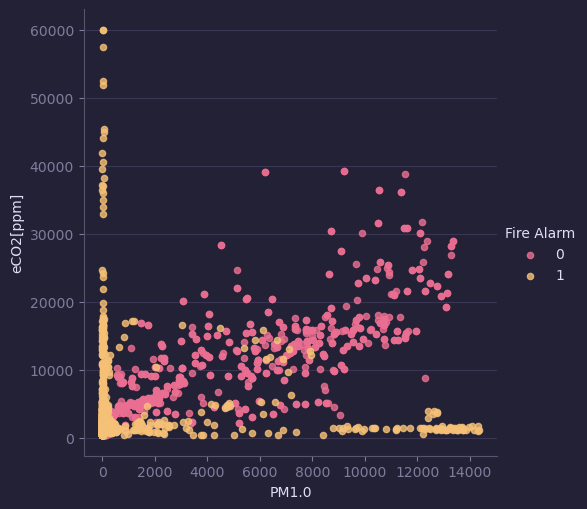

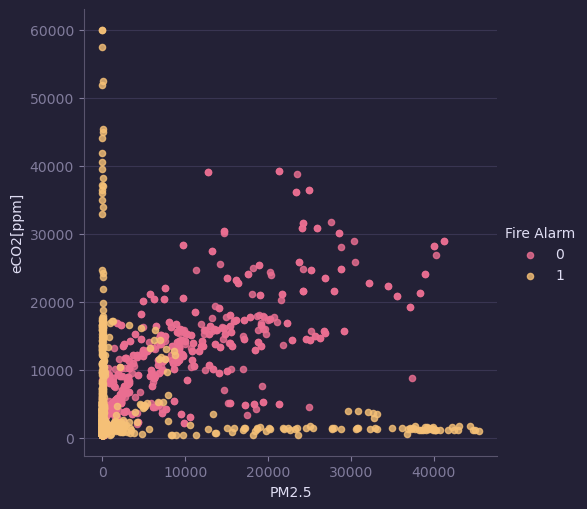

In [24]:
sns.lmplot('PM1.0', 'eCO2[ppm]', data=train, hue='Fire Alarm', fit_reg=False, scatter_kws={'s': marker_size})
sns.lmplot('PM2.5', 'eCO2[ppm]', data=train, hue='Fire Alarm', fit_reg=False, scatter_kws={'s': marker_size})
plt.show()

We could see the situation where a fire is present, eCO2 level is high but both PM1.0 and PM2.5 is very low. This may be due to the fire might be burning efficiently, resulting in minimal particulate matter emissions. In such cases, the majority of the combustion byproducts are in the form of gases, including carbon dioxide (CO2) and other volatile compounds, leading to elevated eCO2 levels. This can happen in well-controlled or controlled combustion processes, such as gas fires or clean-burning fuel sources. This is possible as there are data obtained near a gas grill.

High PM1.0 or PM2.5 but low eCO2 (Fire is present): The fire may be burning inefficiently or experiencing incomplete combustion. In such cases, the fire generates more particulate matter and smoke rather than producing significant amounts of carbon dioxide. This could occur with certain fuel types, combustion conditions, or ventilation limitations.

In [25]:
xcols = train.columns.drop('Fire Alarm')

In [26]:
import scipy.stats as stats

corr_vec = []

for col in xcols:
  correlation_coefficient, p_value = stats.pointbiserialr(train['Fire Alarm'], train[col])
  corr_vec.append(correlation_coefficient)

corr_df = pd.DataFrame({'column': xcols, 'corr': corr_vec})

corr_df

,column,corr
0,Temperature[C],-0.165050
1,Humidity[%],0.400435
2,TVOC[ppb],-0.213905
3,eCO2[ppm],-0.094754
4,Raw H2,0.105850
5,Raw Ethanol,-0.342559
6,Pressure[hPa],0.249960
7,PM1.0,-0.108242
8,PM2.5,-0.081437
9,NC0.5,-0.127507


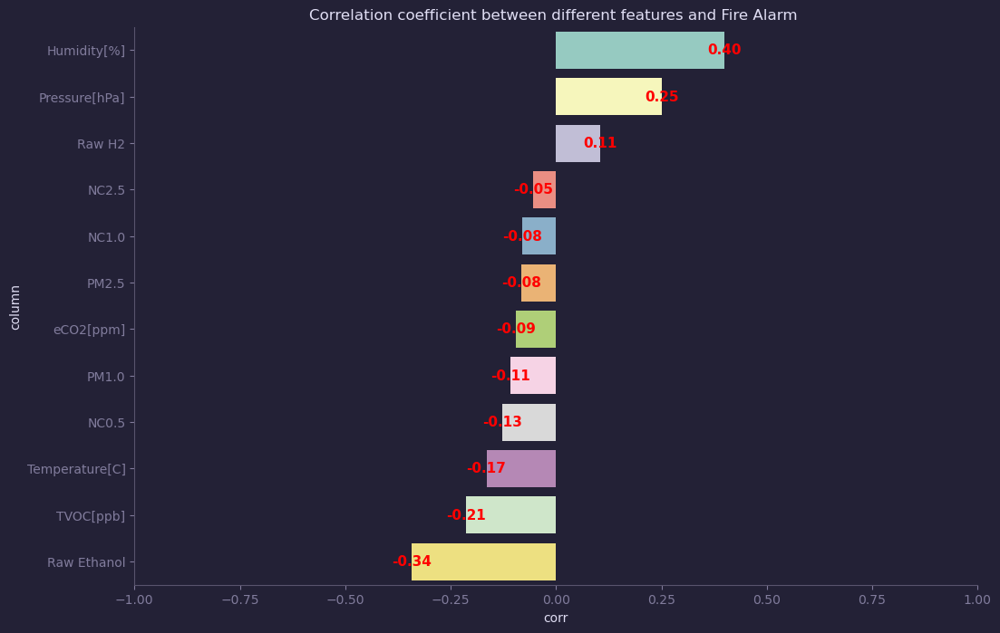

In [27]:
plt.figure(figsize=(12,8))
sorted_df = corr_df.sort_values(by='corr', ascending=False)
sns.barplot(x=sorted_df['corr'], y=sorted_df['column'], palette='Set3')
plt.xlim(-1, 1)
plt.title('Correlation coefficient between different features and Fire Alarm ')
for i, value in enumerate(sorted_df['corr']):
    plt.annotate(f"{value:.2f}", (value, i), ha='center', va='center', color='red', weight='bold', fontsize=11)
plt.show()

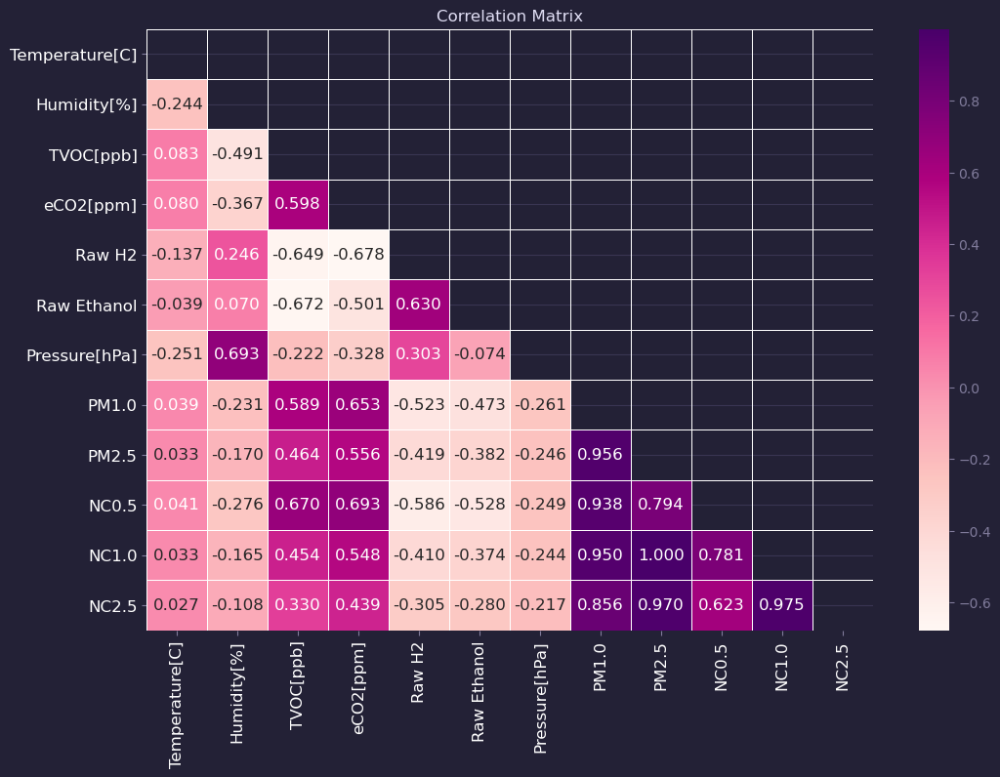

In [28]:
import numpy as np
plt.figure(figsize = (12,8))
x = train.drop('Fire Alarm', axis = 1)
corr = x.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
cormat = sns.heatmap(corr, mask=mask, annot=True, cmap='RdPu', linewidths=0.5, fmt=".3f", annot_kws={'fontsize': 12})
cormat.set_xticklabels(cormat.get_xticklabels(), color='white', fontsize=12)
cormat.set_yticklabels(cormat.get_yticklabels(), color='white', fontsize=12)
cormat.set_title('Correlation Matrix')
plt.show()

# Principal Component Analysis

In [29]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

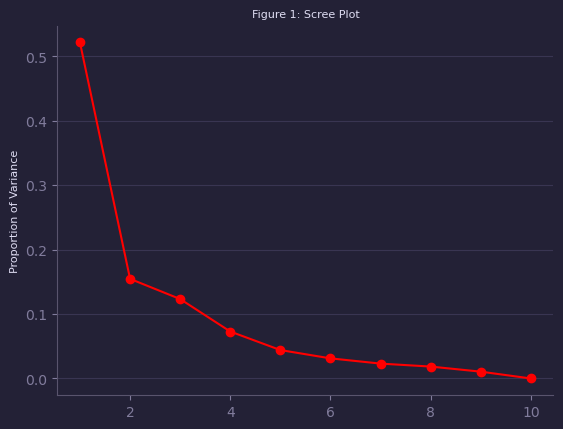

In [30]:
pca = PCA(n_components=10)
pca.fit_transform(x_scaled)

prop_var = pca.explained_variance_ratio_
PC_numbers = np.arange(pca.n_components_) + 1
 
plt.plot(PC_numbers, 
         prop_var, 
         'ro-')
plt.title('Figure 1: Scree Plot', fontsize=8)
plt.ylabel('Proportion of Variance', fontsize=8)
plt.show()

In [31]:
pca.explained_variance_ratio_.cumsum()

array([0.52162121, 0.67627018, 0.79958308, 0.87248134, 0.91660539,
       0.94783332, 0.97092493, 0.98940257, 1.        , 1.        ])

In [32]:
pca = PCA(n_components=4)
pca_features = pca.fit_transform(x_scaled)

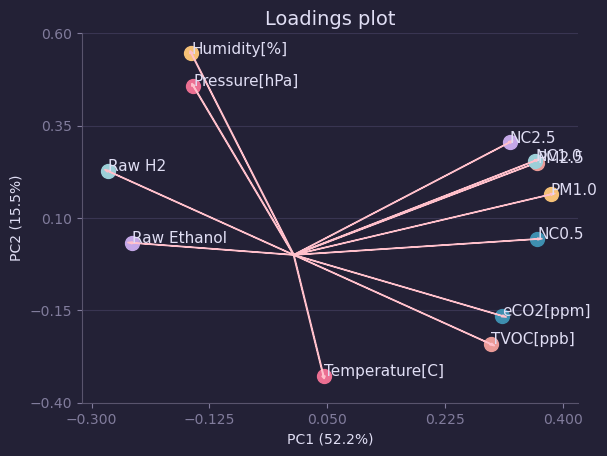

In [33]:
loadings = pca.components_
feature_names = xcols

# Get the loadings of x and y axes
xs = loadings[0]
ys = loadings[1]
 
# Plot the loadings on a scatterplot
for i, varnames in enumerate(feature_names):
    plt.scatter(xs[i], ys[i], s=100)
    plt.arrow(
        0, 0, # coordinates of arrow base
        xs[i], # length of the arrow along x
        ys[i], # length of the arrow along y
        color='pink', 
        head_width=0.005
        )
    plt.text(xs[i], ys[i], varnames, fontsize = 11)
 
# Define the axes
xticks = np.linspace(-0.3, 0.4, num=5)
yticks = np.linspace(-0.4, 0.6, num=5)
plt.xticks(xticks)
plt.yticks(yticks)
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)')

plt.title('Loadings plot', fontsize = 14)
plt.show()

In [34]:
pca_df = pd.DataFrame(
    data=pca_features, 
    columns=['PC1', 'PC2', 'PC3', 'PC4'])
  
pca_df['target'] = np.array(train['Fire Alarm'])

pca_df.head(10)

,PC1,PC2,PC3,PC4,target
0,-0.831287,1.077419,-0.169209,0.784541,1
1,-0.004784,-0.388130,-0.249704,0.721359,1
2,-0.072403,-0.171823,-0.294755,0.218796,1
3,7.777603,-6.434928,-3.795559,1.316332,0
4,-0.881764,0.517732,0.550122,0.429902,1
5,-0.114533,0.046633,-0.478495,0.823315,1
6,-0.323608,0.519969,-0.725345,1.037090,0
7,-0.200479,0.099276,-0.340950,0.873875,1
8,-0.658401,0.750546,-0.099910,0.463161,1
9,-0.012893,-0.094047,-0.507358,0.064344,1


In [35]:
pca_df['target'] = pca_df['target'].astype('category')

In [37]:
# Score Plot
import plotly.express as px
fig = px.scatter(pca_df, x='PC1', y='PC2',title='Score Plot')
fig.show()

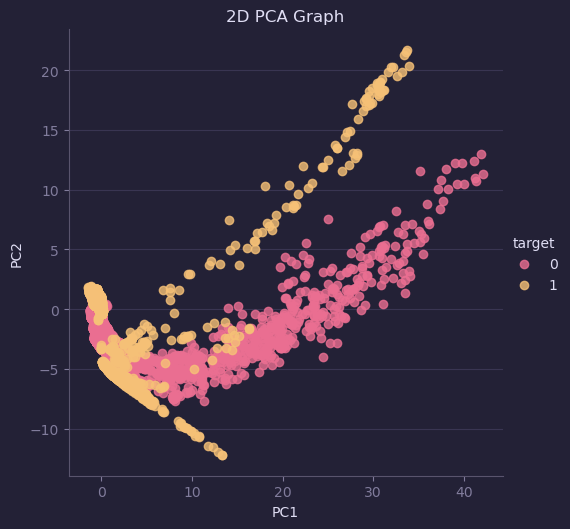

In [38]:
sns.lmplot(
    x='PC1', 
    y='PC2', 
    data=pca_df, 
    hue='target', 
    fit_reg=False, 
    legend=True
    )
 
plt.title('2D PCA Graph')
plt.show()

In [39]:
total_var = pca.explained_variance_ratio_[:2].sum() * 100
fig = px.scatter_3d(pca_df, x='PC1', y='PC2', z='PC3',
              color='target', title=f'Total Explained Variance: {total_var:.2f}%')
fig.update_traces(marker=dict(size=4))
fig.show()

# Clustering

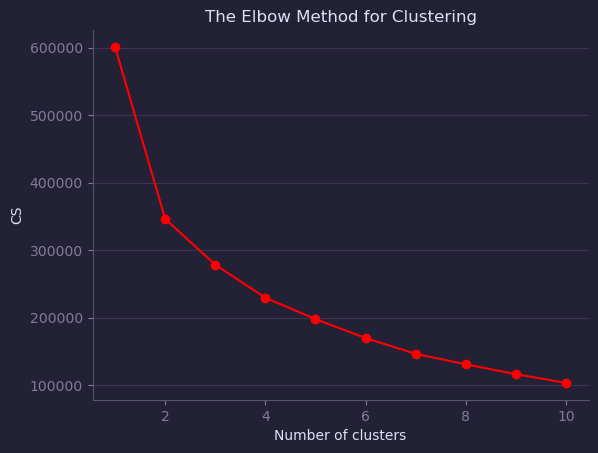

In [40]:
from sklearn.cluster import KMeans

cs = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(x_scaled)
    cs.append(kmeans.inertia_)
plt.plot(range(1, 11), cs, 'ro-')
plt.title('The Elbow Method for Clustering')
plt.xlabel('Number of clusters')
plt.ylabel('CS')
plt.show()

In [41]:
kmeans = KMeans(n_clusters=2,random_state=0)
kmeans.fit(x_scaled)
label = kmeans.fit_predict(x)
u_labels = np.unique(label)

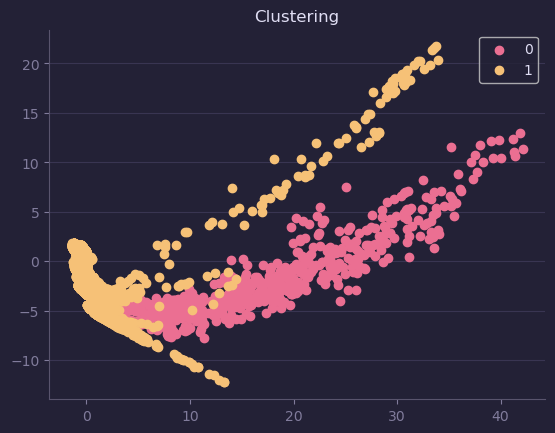

In [42]:
for i in u_labels:
    plt.scatter(pca_df[label == i]['PC1'] , pca_df[label == i]['PC2'] , label = i)
plt.title('Clustering')
plt.legend()
plt.show()

In [44]:
correct_labels = sum(train['Fire Alarm'] == label)

print("Result: %d out of %d samples were correctly labeled in clustering." % (correct_labels, train['Fire Alarm'].size))

print('Accuracy score: {0:0.2f}'. format(correct_labels/float(train['Fire Alarm'].size)))

Result: 36718 out of 50104 samples were correctly labeled in clustering.
Accuracy score: 0.73


# Model Fitting

### Logistic Regression

In [45]:
import statsmodels.api as sm
logit_model=sm.Logit(train['Fire Alarm'],x)
result=logit_model.fit()
print(result.summary2())

Optimization terminated successfully.
         Current function value: 0.269558
         Iterations 13
                          Results: Logit
Model:                Logit            Pseudo R-squared: 0.549     
Dependent Variable:   Fire Alarm       AIC:              27035.8892
Date:                 2023-07-18 08:39 BIC:              27141.7514
No. Observations:     50104            Log-Likelihood:   -13506.   
Df Model:             11               LL-Null:          -29942.   
Df Residuals:         50092            LLR p-value:      0.0000    
Converged:            1.0000           Scale:            1.0000    
No. Iterations:       13.0000                                      
-------------------------------------------------------------------
                Coef.   Std.Err.    z     P>|z|    [0.025   0.975] 
-------------------------------------------------------------------
Temperature[C]  -0.0475   0.0015 -32.1202 0.0000   -0.0504  -0.0446
Humidity[%]     -0.0218   0.0024  -9.000

In [46]:
# Dropping insignificant variables

logit_model2=sm.Logit(train['Fire Alarm'],x.drop('PM2.5', axis = 1))
result=logit_model2.fit()
print(result.summary2())

Optimization terminated successfully.
         Current function value: 0.269558
         Iterations 13
                          Results: Logit
Model:                Logit            Pseudo R-squared: 0.549     
Dependent Variable:   Fire Alarm       AIC:              27033.8892
Date:                 2023-07-18 08:39 BIC:              27130.9296
No. Observations:     50104            Log-Likelihood:   -13506.   
Df Model:             10               LL-Null:          -29942.   
Df Residuals:         50093            LLR p-value:      0.0000    
Converged:            1.0000           Scale:            1.0000    
No. Iterations:       13.0000                                      
-------------------------------------------------------------------
                Coef.   Std.Err.    z     P>|z|    [0.025   0.975] 
-------------------------------------------------------------------
Temperature[C]  -0.0475   0.0015 -32.1202 0.0000   -0.0504  -0.0446
Humidity[%]     -0.0218   0.0024  -9.000

In [47]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

logreg = LogisticRegression()
logreg.fit(x.drop('PM2.5', axis = 1), train['Fire Alarm'])

X_test = test[xcols].drop('PM2.5', axis = 1)
y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, test['Fire Alarm'])))

Accuracy of logistic regression classifier on test set: 0.88


In [48]:
from sklearn.metrics import classification_report
print(classification_report(test['Fire Alarm'], y_pred))

              precision    recall  f1-score   support

           0       0.93      0.64      0.76      3594
           1       0.87      0.98      0.92      8932

    accuracy                           0.88     12526
   macro avg       0.90      0.81      0.84     12526
weighted avg       0.89      0.88      0.88     12526



### Random Forest

In [49]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from scipy.stats import randint

# Tree Visualisation
from sklearn.tree import export_graphviz
from IPython.display import Image
import graphviz

In [50]:
rf = RandomForestClassifier()
rf.fit(x, train['Fire Alarm'])

RandomForestClassifier()

In [52]:
X_test = test[xcols]
y_pred = rf.predict(X_test)

In [53]:
accuracy = accuracy_score(test['Fire Alarm'], y_pred)
print("Accuracy:", accuracy)

Accuracy: 1.0


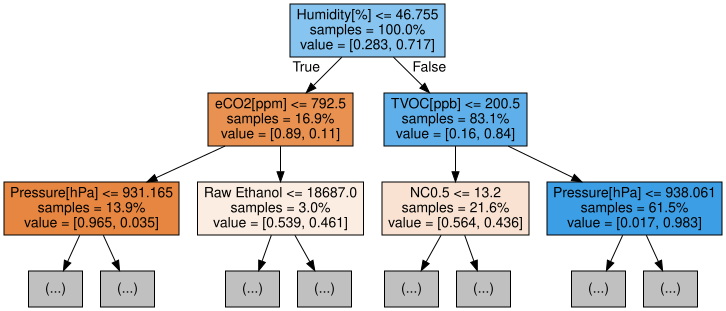

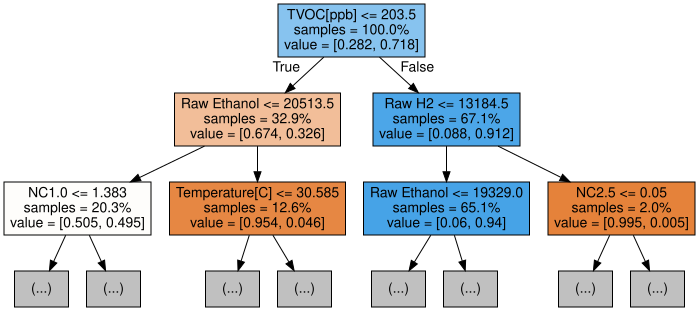

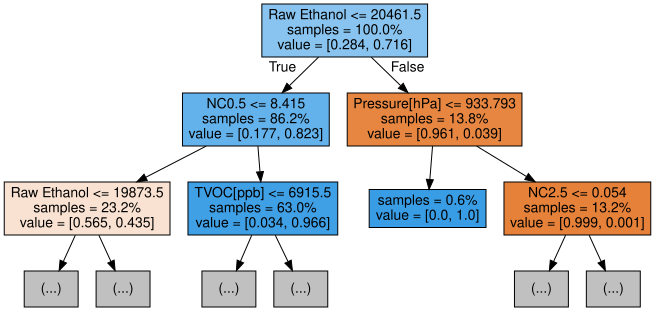

In [55]:
for i in range(3):
    tree = rf.estimators_[i]
    dot_data = export_graphviz(tree,
                               feature_names=x.columns,  
                               filled=True,  
                               max_depth=2, 
                               impurity=False, 
                               proportion=True)
    graph = graphviz.Source(dot_data)
    display(graph)

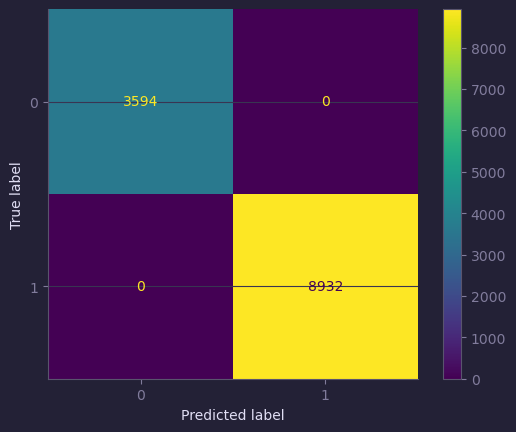

In [59]:
cm = confusion_matrix(test['Fire Alarm'], y_pred)

ConfusionMatrixDisplay(confusion_matrix = cm).plot()

In [60]:
print(classification_report(test['Fire Alarm'], y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3594
           1       1.00      1.00      1.00      8932

    accuracy                           1.00     12526
   macro avg       1.00      1.00      1.00     12526
weighted avg       1.00      1.00      1.00     12526



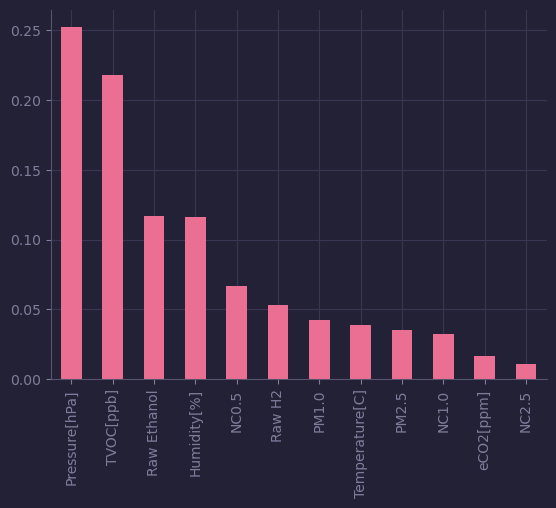

In [61]:
feature_importances = pd.Series(rf.feature_importances_, index=x.columns).sort_values(ascending=False)

# Plot a simple bar chart
feature_importances.plot.bar();

In [68]:
feature_importances[:4]

Pressure[hPa]    0.252104
TVOC[ppb]        0.218082
Raw Ethanol      0.117071
Humidity[%]      0.116497
dtype: float64

Let's fit the rf tree only with these variables

In [70]:
rf_2 = RandomForestClassifier()
selected_cols = ['Pressure[hPa]','TVOC[ppb]', 'Raw Ethanol', 'Humidity[%]']
X_train = x[selected_cols]
rf_2.fit(X_train, train['Fire Alarm'])

RandomForestClassifier()

In [75]:
X_test = test[selected_cols]
y_pred = rf_2.predict(X_test)

In [76]:
accuracy = accuracy_score(test['Fire Alarm'], y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9996806642184257


<Figure size 500x500 with 0 Axes>

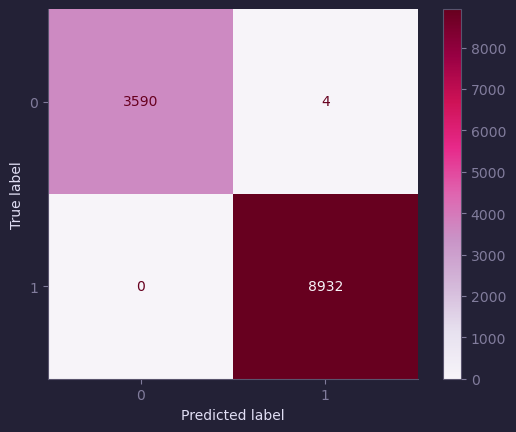

In [83]:
cm = confusion_matrix(test['Fire Alarm'], y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix = cm)
plt.figure(figsize=(5, 5))
disp.plot(cmap='PuRd', values_format='.0f')
plt.grid(False)
plt.show()

In [85]:
rf = RandomForestClassifier(random_state=42, n_jobs=-1)
params = {
    'max_depth': [2,3,5,10,20],
    'min_samples_leaf': [5,10,20,50,100,200],
    'n_estimators': [10,25,30,50,100,200]
}

from sklearn.model_selection import GridSearchCV

grid_search = GridSearchCV(estimator=rf,
                           param_grid=params,
                           cv = 4,
                           n_jobs=-1, verbose=1, scoring="accuracy")

grid_search.fit(X_train, train['Fire Alarm'])

Fitting 4 folds for each of 180 candidates, totalling 720 fits


GridSearchCV(cv=4, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100, 200],
                         'n_estimators': [10, 25, 30, 50, 100, 200]},
             scoring='accuracy', verbose=1)

In [86]:
grid_search.best_score_

0.9996008302730321

In [87]:
rf_best = grid_search.best_estimator_
rf_best

RandomForestClassifier(max_depth=20, min_samples_leaf=5, n_estimators=30,
                       n_jobs=-1, random_state=42)

In [88]:
rf_best = RandomForestClassifier(max_depth=20, min_samples_leaf=5, n_estimators=30,
                       n_jobs=-1, random_state=42)

rf_best.fit(X_train, train['Fire Alarm'])

RandomForestClassifier(max_depth=20, min_samples_leaf=5, n_estimators=30,
                       n_jobs=-1, random_state=42)

In [89]:
y_pred = rf_best.predict(X_test)
accuracy = accuracy_score(test['Fire Alarm'], y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9996806642184257


It was the same accuracy without hyperparameter tuning